<a href="https://colab.research.google.com/github/malakagunasekara/imageprocessing/blob/main/Q9.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

IMAGE SHARPENING

Please upload an image to sharpen...


Saving image_2026-01-27_223242030.png to image_2026-01-27_223242030.png

Color image loaded: (604, 902, 3)

METHOD 1: UNSHARP MASKING
✓ Unsharp mask applied with strength = 0.5
✓ Unsharp mask applied with strength = 1.0
✓ Unsharp mask applied with strength = 1.5
✓ Unsharp mask applied with strength = 2.0


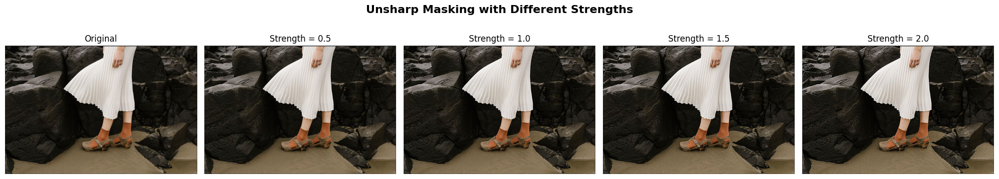

✓ Unsharp masking visualization saved!

METHOD 2: LAPLACIAN SHARPENING
✓ Laplacian sharpening applied with strength = 0.5
✓ Laplacian sharpening applied with strength = 1.0
✓ Laplacian sharpening applied with strength = 1.5
✓ Laplacian sharpening applied with strength = 2.0


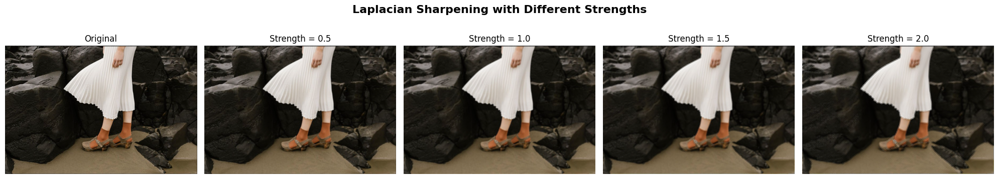

✓ Laplacian sharpening visualization saved!

METHOD 3: HIGH-PASS FILTER SHARPENING
✓ High-pass filter applied with strength = 0.5
✓ High-pass filter applied with strength = 1.0
✓ High-pass filter applied with strength = 1.5
✓ High-pass filter applied with strength = 2.0


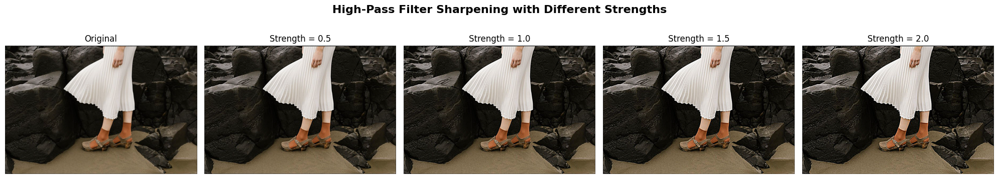

✓ High-pass filter visualization saved!

METHOD 4: CUSTOM KERNEL SHARPENING
✓ Basic kernel applied
✓ Strong kernel applied
✓ Extreme kernel applied
✓ Diagonal kernel applied


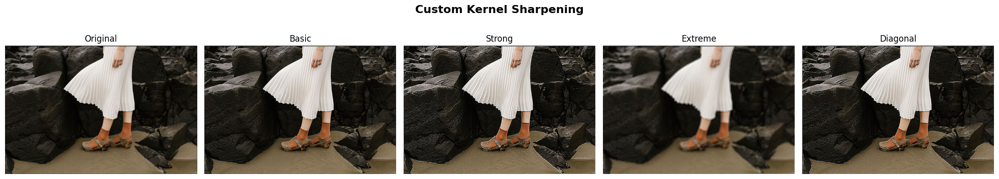

✓ Custom kernel visualization saved!

COMPREHENSIVE COMPARISON


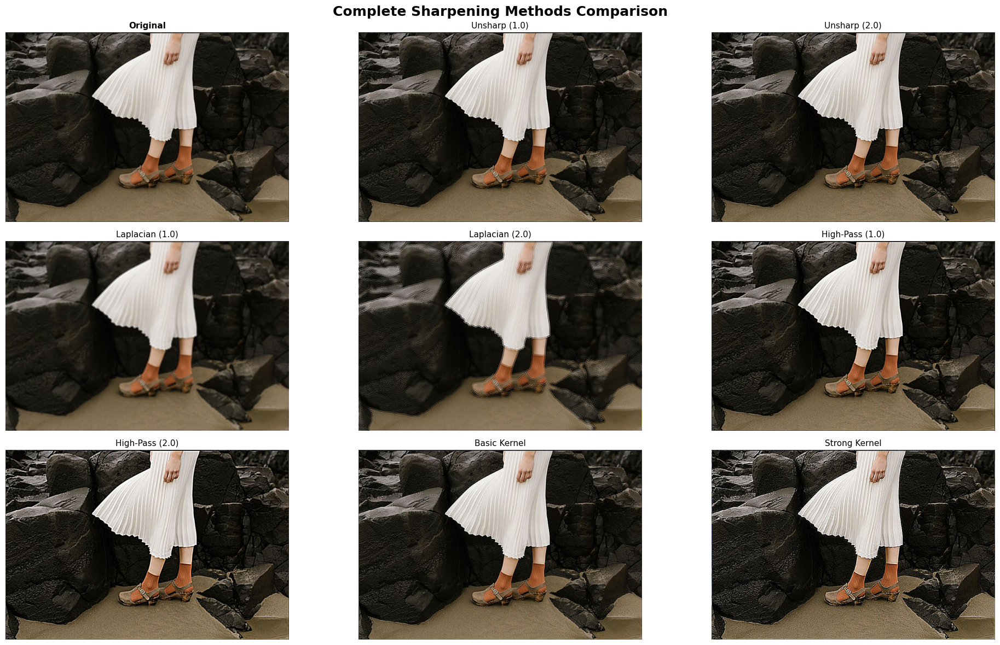

✓ Comprehensive comparison saved!

DETAIL VIEW


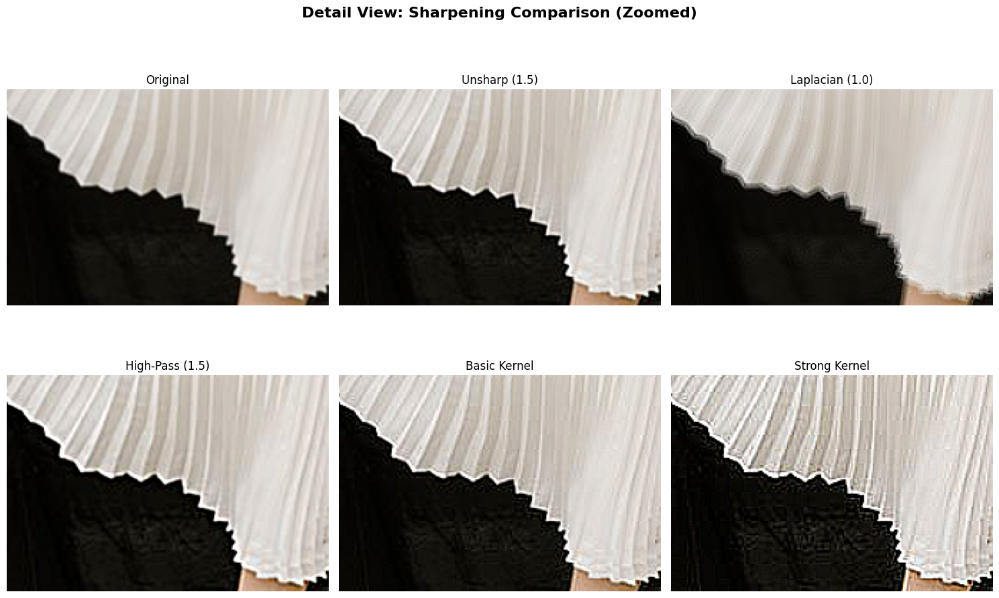

✓ Detail comparison saved!

SAVING SHARPENED IMAGES
✓ sharpened_unsharp.png
✓ sharpened_laplacian.png
✓ sharpened_highpass.png
✓ sharpened_kernel.png

SUMMARY

Sharpening Methods Applied:

1. UNSHARP MASKING
   Formula: Sharp = Original + strength × (Original - Blurred)
   Best for: General purpose, natural-looking results

2. LAPLACIAN SHARPENING
   Formula: Sharp = Original + strength × Laplacian(Original)
   Best for: Edge enhancement, strong sharpening

3. HIGH-PASS FILTER
   Formula: Sharp = Original + strength × (Original - LowPass)
   Best for: Detail enhancement, subtle sharpening

4. CUSTOM KERNELS
   Different kernel patterns for various effects
   Best for: Quick application, specific patterns

Recommendations:
- Mild sharpening: Unsharp mask (strength 0.5-1.0)
- Moderate sharpening: High-pass filter (strength 1.0-1.5)
- Strong sharpening: Laplacian (strength 1.0-1.5)
- Extreme sharpening: Custom kernels (Strong/Extreme)


ALL FILES SAVED

Generated files in /content/:
  1. 

In [1]:
"""
Image Sharpening - Question 9
"""

import numpy as np
import matplotlib.pyplot as plt
import cv2
from google.colab import files
from PIL import Image
import io

print("=" * 70)
print("IMAGE SHARPENING")
print("=" * 70)

# ============================================================================
# Load Image
# ============================================================================

print("\nPlease upload an image to sharpen...")
uploaded = files.upload()

image_filename = list(uploaded.keys())[0]
image_bytes = uploaded[image_filename]

img_pil = Image.open(io.BytesIO(image_bytes))
img = np.array(img_pil)

if len(img.shape) == 2:
    img_gray = img
    is_color = False
    print(f"\nGrayscale image loaded: {img.shape}")
else:
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    is_color = True
    print(f"\nColor image loaded: {img.shape}")

# ============================================================================
# Method 1: Unsharp Masking
# ============================================================================

print("\n" + "=" * 70)
print("METHOD 1: UNSHARP MASKING")
print("=" * 70)

def unsharp_mask(image, sigma=1.0, strength=1.5):
    blurred = cv2.GaussianBlur(image, (0, 0), sigma)
    sharpened = cv2.addWeighted(image, 1.0 + strength, blurred, -strength, 0)
    return np.clip(sharpened, 0, 255).astype(np.uint8)

unsharp_results = {}
strengths = [0.5, 1.0, 1.5, 2.0]

for strength in strengths:
    if is_color:
        sharpened = np.zeros_like(img)
        for i in range(3):
            sharpened[:,:,i] = unsharp_mask(img[:,:,i], sigma=1.0, strength=strength)
    else:
        sharpened = unsharp_mask(img_gray, sigma=1.0, strength=strength)
    unsharp_results[strength] = sharpened
    print(f"✓ Unsharp mask applied with strength = {strength}")

fig, axes = plt.subplots(1, 5, figsize=(20, 4))
fig.suptitle('Unsharp Masking with Different Strengths', fontsize=16, fontweight='bold')

if is_color:
    axes[0].imshow(img)
else:
    axes[0].imshow(img_gray, cmap='gray')
axes[0].set_title('Original', fontsize=12)
axes[0].axis('off')

for idx, strength in enumerate(strengths):
    if is_color:
        axes[idx + 1].imshow(unsharp_results[strength])
    else:
        axes[idx + 1].imshow(unsharp_results[strength], cmap='gray')
    axes[idx + 1].set_title(f'Strength = {strength}', fontsize=12)
    axes[idx + 1].axis('off')

plt.tight_layout()
plt.savefig('/content/unsharp_masking.png', dpi=150, bbox_inches='tight')
plt.show()
print("✓ Unsharp masking visualization saved!")

# ============================================================================
# Method 2: Laplacian Sharpening
# ============================================================================

print("\n" + "=" * 70)
print("METHOD 2: LAPLACIAN SHARPENING")
print("=" * 70)

def laplacian_sharpen(image, strength=1.0):
    laplacian = cv2.Laplacian(image, cv2.CV_64F)
    sharpened = image.astype(np.float64) + strength * laplacian
    return np.clip(sharpened, 0, 255).astype(np.uint8)

laplacian_results = {}
strengths = [0.5, 1.0, 1.5, 2.0]

for strength in strengths:
    if is_color:
        sharpened = np.zeros_like(img)
        for i in range(3):
            sharpened[:,:,i] = laplacian_sharpen(img[:,:,i], strength=strength)
    else:
        sharpened = laplacian_sharpen(img_gray, strength=strength)
    laplacian_results[strength] = sharpened
    print(f"✓ Laplacian sharpening applied with strength = {strength}")

fig, axes = plt.subplots(1, 5, figsize=(20, 4))
fig.suptitle('Laplacian Sharpening with Different Strengths', fontsize=16, fontweight='bold')

if is_color:
    axes[0].imshow(img)
else:
    axes[0].imshow(img_gray, cmap='gray')
axes[0].set_title('Original', fontsize=12)
axes[0].axis('off')

for idx, strength in enumerate(strengths):
    if is_color:
        axes[idx + 1].imshow(laplacian_results[strength])
    else:
        axes[idx + 1].imshow(laplacian_results[strength], cmap='gray')
    axes[idx + 1].set_title(f'Strength = {strength}', fontsize=12)
    axes[idx + 1].axis('off')

plt.tight_layout()
plt.savefig('/content/laplacian_sharpening.png', dpi=150, bbox_inches='tight')
plt.show()
print("✓ Laplacian sharpening visualization saved!")

# ============================================================================
# Method 3: High-Pass Filter Sharpening
# ============================================================================

print("\n" + "=" * 70)
print("METHOD 3: HIGH-PASS FILTER SHARPENING")
print("=" * 70)

def highpass_sharpen(image, sigma=2.0, strength=1.0):
    lowpass = cv2.GaussianBlur(image, (0, 0), sigma)
    highpass = image.astype(np.float64) - lowpass.astype(np.float64)
    sharpened = image.astype(np.float64) + strength * highpass
    return np.clip(sharpened, 0, 255).astype(np.uint8)

highpass_results = {}
strengths = [0.5, 1.0, 1.5, 2.0]

for strength in strengths:
    if is_color:
        sharpened = np.zeros_like(img)
        for i in range(3):
            sharpened[:,:,i] = highpass_sharpen(img[:,:,i], sigma=2.0, strength=strength)
    else:
        sharpened = highpass_sharpen(img_gray, sigma=2.0, strength=strength)
    highpass_results[strength] = sharpened
    print(f"✓ High-pass filter applied with strength = {strength}")

fig, axes = plt.subplots(1, 5, figsize=(20, 4))
fig.suptitle('High-Pass Filter Sharpening with Different Strengths', fontsize=16, fontweight='bold')

if is_color:
    axes[0].imshow(img)
else:
    axes[0].imshow(img_gray, cmap='gray')
axes[0].set_title('Original', fontsize=12)
axes[0].axis('off')

for idx, strength in enumerate(strengths):
    if is_color:
        axes[idx + 1].imshow(highpass_results[strength])
    else:
        axes[idx + 1].imshow(highpass_results[strength], cmap='gray')
    axes[idx + 1].set_title(f'Strength = {strength}', fontsize=12)
    axes[idx + 1].axis('off')

plt.tight_layout()
plt.savefig('/content/highpass_sharpening.png', dpi=150, bbox_inches='tight')
plt.show()
print("✓ High-pass filter visualization saved!")

# ============================================================================
# Method 4: Custom Kernel Sharpening
# ============================================================================

print("\n" + "=" * 70)
print("METHOD 4: CUSTOM KERNEL SHARPENING")
print("=" * 70)

kernels = {
    'Basic': np.array([[0, -1, 0],
                       [-1, 5, -1],
                       [0, -1, 0]]),
    'Strong': np.array([[-1, -1, -1],
                        [-1, 9, -1],
                        [-1, -1, -1]]),
    'Extreme': np.array([[1, 1, 1],
                         [1, -7, 1],
                         [1, 1, 1]]),
    'Diagonal': np.array([[-1, 0, -1],
                          [0, 5, 0],
                          [-1, 0, -1]])
}

kernel_results = {}

for name, kernel in kernels.items():
    if is_color:
        sharpened = np.zeros_like(img)
        for i in range(3):
            sharpened[:,:,i] = cv2.filter2D(img[:,:,i], -1, kernel)
    else:
        sharpened = cv2.filter2D(img_gray, -1, kernel)
    kernel_results[name] = np.clip(sharpened, 0, 255).astype(np.uint8)
    print(f"✓ {name} kernel applied")

fig, axes = plt.subplots(1, 5, figsize=(20, 4))
fig.suptitle('Custom Kernel Sharpening', fontsize=16, fontweight='bold')

if is_color:
    axes[0].imshow(img)
else:
    axes[0].imshow(img_gray, cmap='gray')
axes[0].set_title('Original', fontsize=12)
axes[0].axis('off')

for idx, (name, result) in enumerate(kernel_results.items()):
    if is_color:
        axes[idx + 1].imshow(result)
    else:
        axes[idx + 1].imshow(result, cmap='gray')
    axes[idx + 1].set_title(name, fontsize=12)
    axes[idx + 1].axis('off')

plt.tight_layout()
plt.savefig('/content/kernel_sharpening.png', dpi=150, bbox_inches='tight')
plt.show()
print("✓ Custom kernel visualization saved!")

# ============================================================================
# Comprehensive Comparison
# ============================================================================

print("\n" + "=" * 70)
print("COMPREHENSIVE COMPARISON")
print("=" * 70)

fig = plt.figure(figsize=(20, 12))
fig.suptitle('Complete Sharpening Methods Comparison', fontsize=18, fontweight='bold')

methods = [
    ('Original', img if is_color else img_gray),
    ('Unsharp (1.0)', unsharp_results[1.0]),
    ('Unsharp (2.0)', unsharp_results[2.0]),
    ('Laplacian (1.0)', laplacian_results[1.0]),
    ('Laplacian (2.0)', laplacian_results[2.0]),
    ('High-Pass (1.0)', highpass_results[1.0]),
    ('High-Pass (2.0)', highpass_results[2.0]),
    ('Basic Kernel', kernel_results['Basic']),
    ('Strong Kernel', kernel_results['Strong'])
]

for idx, (name, image) in enumerate(methods):
    ax = plt.subplot(3, 3, idx + 1)
    if is_color:
        ax.imshow(image)
    else:
        ax.imshow(image, cmap='gray')
    ax.set_title(name, fontsize=11, fontweight='bold' if idx == 0 else 'normal')
    ax.axis('off')

plt.tight_layout()
plt.savefig('/content/comprehensive_comparison.png', dpi=150, bbox_inches='tight')
plt.show()
print("✓ Comprehensive comparison saved!")

# ============================================================================
# Detail View (Zoomed)
# ============================================================================

print("\n" + "=" * 70)
print("DETAIL VIEW")
print("=" * 70)

h, w = img_gray.shape[:2]
y1, y2 = h//3, h//3 + h//4
x1, x2 = w//3, w//3 + w//4

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('Detail View: Sharpening Comparison (Zoomed)', fontsize=16, fontweight='bold')

zoom_images = [
    ('Original', img if is_color else img_gray),
    ('Unsharp (1.5)', unsharp_results[1.5]),
    ('Laplacian (1.0)', laplacian_results[1.0]),
    ('High-Pass (1.5)', highpass_results[1.5]),
    ('Basic Kernel', kernel_results['Basic']),
    ('Strong Kernel', kernel_results['Strong'])
]

for idx, (name, image) in enumerate(zoom_images):
    row, col = idx // 3, idx % 3
    if is_color:
        axes[row, col].imshow(image[y1:y2, x1:x2])
    else:
        axes[row, col].imshow(image[y1:y2, x1:x2], cmap='gray')
    axes[row, col].set_title(name, fontsize=12)
    axes[row, col].axis('off')

plt.tight_layout()
plt.savefig('/content/detail_comparison.png', dpi=150, bbox_inches='tight')
plt.show()
print("✓ Detail comparison saved!")

# ============================================================================
# Save Best Results
# ============================================================================

print("\n" + "=" * 70)
print("SAVING SHARPENED IMAGES")
print("=" * 70)

best_unsharp = Image.fromarray(unsharp_results[1.5])
best_laplacian = Image.fromarray(laplacian_results[1.0])
best_highpass = Image.fromarray(highpass_results[1.5])
best_kernel = Image.fromarray(kernel_results['Basic'])

best_unsharp.save('/content/sharpened_unsharp.png')
best_laplacian.save('/content/sharpened_laplacian.png')
best_highpass.save('/content/sharpened_highpass.png')
best_kernel.save('/content/sharpened_kernel.png')

print("✓ sharpened_unsharp.png")
print("✓ sharpened_laplacian.png")
print("✓ sharpened_highpass.png")
print("✓ sharpened_kernel.png")

print("\n" + "=" * 70)
print("SUMMARY")
print("=" * 70)
print("""
Sharpening Methods Applied:

1. UNSHARP MASKING
   Formula: Sharp = Original + strength × (Original - Blurred)
   Best for: General purpose, natural-looking results

2. LAPLACIAN SHARPENING
   Formula: Sharp = Original + strength × Laplacian(Original)
   Best for: Edge enhancement, strong sharpening

3. HIGH-PASS FILTER
   Formula: Sharp = Original + strength × (Original - LowPass)
   Best for: Detail enhancement, subtle sharpening

4. CUSTOM KERNELS
   Different kernel patterns for various effects
   Best for: Quick application, specific patterns

Recommendations:
- Mild sharpening: Unsharp mask (strength 0.5-1.0)
- Moderate sharpening: High-pass filter (strength 1.0-1.5)
- Strong sharpening: Laplacian (strength 1.0-1.5)
- Extreme sharpening: Custom kernels (Strong/Extreme)
""")

print("\n" + "=" * 70)
print("ALL FILES SAVED")
print("=" * 70)
print("""
Generated files in /content/:
  1. unsharp_masking.png
  2. laplacian_sharpening.png
  3. highpass_sharpening.png
  4. kernel_sharpening.png
  5. comprehensive_comparison.png
  6. detail_comparison.png
  7. sharpened_unsharp.png
  8. sharpened_laplacian.png
  9. sharpened_highpass.png
  10. sharpened_kernel.png
""")
print("=" * 70)

print("\n✅ IMAGE SHARPENING COMPLETE!")